In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import matplotlib.pyplot as plt
import torch
import numpy as np
from torch.optim import Adam
from torch.utils.data import TensorDataset, DataLoader
from tqdm import tqdm
from src.models.components.mlp import MyMLP

import torch
import torchsde
from torch import vmap
from torchdiffeq import odeint

from src.energies.gmm_energy import GMM
from fab.target_distributions import gmm

from src.energies.base_prior import Prior, MeanFreePrior

from src.models.components.clipper import Clipper

from torch.func import hessian

In [3]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

cuda


### Target Distribution

In [4]:
target = GMM(dimensionality=2,
             n_mixes=40,
             loc_scaling= 40,
             log_var_scaling=1.0,
             device=device,
             should_unnormalize=True)

## Function Definitions

In [5]:
class VEReverseSDE(torch.nn.Module):
    noise_type = "diagonal"
    sde_type = "ito"

    def __init__(self, score, noise_schedule):
        super().__init__()
        self.score = score
        self.noise_schedule = noise_schedule

    def f(self, t, x):
        if t.dim() == 0:
            # repeat the same time for all points if we have a scalar time
            t = t * torch.ones(x.shape[0]).to(x.device)

        score = self.score(t, x)
        return self.g(t, x).pow(2) * score

    def g(self, t, x):
        g = self.noise_schedule.g(t)
        return g

In [6]:
def compute_laplacian(model, t, xt):
    
    def func_wrap(t, xt):
        return model(t.unsqueeze(0), xt.unsqueeze(0)).squeeze()
    
    # Calculate the Hessian matrix of the model output with respect to the input
    hessian_matrix = vmap(hessian(func_wrap, argnums=1))(t, xt)

    # Calculate the Laplacian as the trace of the Hessian matrix
    laplacian = hessian_matrix.diagonal(offset=0, dim1=-2, dim2=-1).sum(dim=-1)
    return laplacian

In [7]:
def rademacher(shape, dtype=torch.float32, device='cuda'):
    """Sample from Rademacher distribution."""
    rand = ((torch.rand(shape) < 0.5)) * 2 - 1
    return rand.to(dtype).to(device)

In [8]:
def compute_laplacian_hutchinson(nabla_Ut, t, xt):
    # Compute the noise
    noise = rademacher(xt.shape, dtype=torch.float32, device=device)
    # Compute the jvp of the nabla_Ut and the noise
    jvp = torch.autograd.grad(nabla_Ut, xt, noise, create_graph=True)[0] # nabla(nabla_Ut) * noise
    
    laplacian = (jvp * noise).sum(-1)
    return laplacian

In [9]:
def true_Ut(target, x, t, noise_schedule):
    h_t = noise_schedule.h(t).to(device) #[0]
    target.gmm.convolve(h_t * (target.data_normalization_factor **2), t)
    energy = target(x)
    target.gmm.reset()
    return energy

In [10]:
def compute_true_laplacian(target, t, x, noise_schedule):

    def compute_hessian(target, t, x):
       return hessian(true_Ut, argnums=1)(target, x, t, noise_schedule)
    # Calculate the Hessian matrix of the model output with respect to the input
    # hessian_matrix = vmap(hessian(true_Ut, argnums=1), in_dims=(None, 0, 0, None))(target, x, t, noise_schedule)
    hessian_matrix = torch.vmap(compute_hessian, in_dims=(None, 0, 0))(target, t, x)

    # Calculate the Laplacian as the trace of the Hessian matrix
    laplacian = hessian_matrix.diagonal(offset=0, dim1=-2, dim2=-1).sum(dim=-1)
    return laplacian

In [11]:
# def compute_true_laplacian(target, x, t, noise_schedule):


#     # Calculate the Laplacian as the trace of the Hessian matrix
#     laplacian = hessian_matrix.diagonal(offset=0, dim1=-2, dim2=-1).sum(dim=-1)
#     return laplacian

In [12]:
def true_dUt_dt(target, x, t, noise_schedule):
    return torch.func.jacrev(true_Ut, argnums=2)(target, x, t, noise_schedule)

In [13]:
def true_nabla_Ut(target, x, t, noise_schedule):
    nabla_Ut = torch.func.jacrev(true_Ut, argnums=1)(target, x, t, noise_schedule)
    return nabla_Ut

In [14]:
class VEReverse_coupled(torch.nn.Module):
    noise_type = "diagonal"
    sde_type = "ito"

    def __init__(self, model, noise_schedule):
        super().__init__()
        self.model = model
        self.noise_schedule = noise_schedule

    def f(self, t, x, resampling_interval=None):
        if t.dim() == 0:
            # repeat the same time for all points if we have a scalar time
            t = t * torch.ones(x.shape[0]).to(x.device)

        with torch.enable_grad():
            target = GMM(dimensionality=2,
             n_mixes=40,
             loc_scaling= 40,
             log_var_scaling=1.0,
             device=device,
             should_unnormalize=True)
            
            x.requires_grad_(True)
            t.requires_grad_(True)
            epsilon_t = self.g(t, x).pow(2) / 2 

            Ut = self.model(t, x)
            nabla_Ut = torch.autograd.grad(Ut.sum(), x, create_graph=True)[0]
            # nabla_Ut = torch.vmap(true_nabla_Ut, in_dims=(None, 0, 0, None))(target, x, t, self.noise_schedule)
            drift_X = nabla_Ut * self.g(t, x).pow(2).unsqueeze(-1)

            drift_A = torch.zeros(x.shape[0]).to(x.device)

            if resampling_interval is None:
                return  drift_X, drift_A

            dUt_dt = torch.autograd.grad(Ut.sum(), t, create_graph=True)[0]
            # dUt_dt = torch.vmap(true_dUt_dt, in_dims=(None, 0, 0, None))(target, x, t, self.noise_schedule)

            divergence = compute_laplacian(self.model, t, x)
            # divergence = compute_true_laplacian(target, t, x, self.noise_schedule)
            laplacian_b = epsilon_t * divergence
            drift_A = -laplacian_b - epsilon_t * nabla_Ut.pow(2).sum(-1) + dUt_dt

            #print((laplacian_b**2).mean(), (epsilon_t * nabla_Ut.pow(2).sum(-1)).mean(), (dUt_dt**2).mean())

        return  drift_X, drift_A

    def g(self, t, x):
        g = self.noise_schedule.g(t)
        return g

def euler_maruyama_step_coupled(sde, x, t, a, dt, step, resampling_interval):
    # Calculate drift and diffusion terms
    drift_Xt, drift_At = sde.f(t, x, resampling_interval)
    drift_Xt = drift_Xt * dt
    drift_At = drift_At * dt

    if t.dim() == 0:
        # repeat the same time for all points if we have a scalar time
        t = t * torch.ones_like(x).to(device)
    diffusion = sde.g(t, x) * np.sqrt(dt) * torch.randn_like(x).to(device)

    # Update the state
    x_next = x + drift_Xt + diffusion
    a_next = a + drift_At

    if resampling_interval is None or step % resampling_interval != 0:
        return x_next, a_next

    #resample based on the weights
    choice = torch.multinomial(torch.softmax(-a_next, dim=-1), x.shape[0], replacement=True)
    a_next = torch.zeros_like(a_next)
    x_next = x_next[choice]
    
    return x_next, a_next


def integrate_sde_coupled(sde, x0, t_span, dt, resampling_interval):
    times = torch.arange(t_span[0], t_span[1], dt).to(device)
    x = x0
    x0.requires_grad = True
    samples = []
    logweights = []
    a = torch.zeros(x.shape[0]).to(device)
    with torch.no_grad():
        for step, t in enumerate(times):
            x, a = euler_maruyama_step_coupled(sde, x, 1-t, a, dt, step, resampling_interval)
            samples.append(x)
            logweights.append(a)
    return torch.stack(samples), torch.stack(logweights)


def generate_samples_weighted(reverse_sde, num_samples=1000, t_span=(0, 1),
                              num_integration_steps=100, samples=None, resampling_interval=None):
    integrator = integrate_sde_coupled
    if samples is None:
        samples = prior.sample(num_samples)

    dt = 1 / num_integration_steps

    samples, weights = integrator(
        sde=reverse_sde,
        x0=samples,
        t_span=t_span,
        dt=dt,
        resampling_interval = resampling_interval,
    )
    return samples[-1], weights

In [16]:
# sample from a tensor
def sample_from_tensor(tensor, num_samples):
    idx = torch.randint(0, tensor.shape[0], (num_samples,))
    return tensor[idx]


# calculate the log expectation of the reward
def log_E_R(_x, _t, energy, noise_schedule, num_mc_samples):
    repeated_x = _x.unsqueeze(0).repeat_interleave(num_mc_samples, dim=0)
    repeated_t = _t.unsqueeze(0).repeat_interleave(num_mc_samples, dim=0)
    h_t  = noise_schedule.h(repeated_t) 
    h_t = h_t.unsqueeze(1)

    samples = repeated_x + torch.randn(repeated_x.shape).to(device) * (h_t ** 0.5)
    # log_rewards = target(target.unnormalize(samples))
    log_rewards = energy(samples)
    log_expectation_R = torch.logsumexp(log_rewards, dim=-1) - np.log(num_mc_samples)
    return log_expectation_R


# def estimate_grad_Rt(xt,
#                      t,
#                      energy,
#                      diffusion_samples,
#                      noise_schedule,
#                      num_mc_samples=100):
#     est_scores_n = torch.func.grad(log_E_R)(xt, t, energy, noise_schedule, num_mc_samples)
#     return est_scores_n



def loss_mc_estimator(xt,
                      t,
                      energy,
                      model,
                      noise_schedule,
                      num_mc_samples=100):
    repeated_xt = xt.unsqueeze(0)
    h_t  = noise_schedule.h(t)
    device = xt.device
    
    q_normal_proposal = repeated_xt + torch.randn((num_mc_samples,) + xt.size()).to(device) * (h_t ** 0.5)
    q_samples = q_normal_proposal
    
    with torch.no_grad():
        log_p_pre = model(q_samples)
        log_weights = log_p_pre
        target_score  = torch.vmap(torch.func.grad(lambda x: energy(x)))(q_samples)
        scores = target_score

    dem_estimate = torch.nn.functional.softmax(log_weights, dim=0)[:, None] * scores
    grad_log_transition =  (q_samples - repeated_xt) / h_t 
    loss = torch.sum(dem_estimate - grad_log_transition, dim=0)

    return loss

In [16]:
def reward_matching_loss(estimator,
                         model,
                         energy,
                         x,
                         t,
                         noise_schedule,
                         num_mc_samples=100,
                         clip=True
    ):


    x.requires_grad = True

    h_t = noise_schedule.h(t.unsqueeze(1))
    
    # noisy sample: x(t)
    xt = torch.normal(x, h_t**0.5)

    # predicted score
    pred_energy = model(t, xt)

    pred_scores = torch.autograd.grad(
        pred_energy.sum(), xt, create_graph=True
    )[0]

    estimated_scores = torch.vmap(estimator, randomness="different",
                                  in_dims=(0, 0, None, None, None))(
                                    xt,
                                    t,
                                    energy,
                                    model,
                                    noise_schedule,
                                    num_mc_samples=num_mc_samples,
                                ).detach()


    if clip:
        estimated_scores = clipper.clip_scores(estimated_scores)

    err = (
        estimated_scores - pred_scores
    ) ** 2
    return err.mean()

### Energy Model

In [28]:
from torch import nn
class EnergyNet(nn.Module):
    def __init__(
        self, 
        score_net: nn.Module,
        prior
    ):
        super(EnergyNet, self).__init__()
        self.score_net = score_net
        self.prior =prior

    def forward(self, t: torch.Tensor, x: torch.Tensor) -> torch.Tensor:
        # parametrize energy as <score_net(t, x), x>
        U_1 = prior.log_prob(x)
        U_theta = torch.sum(self.score_net(t, x) * x, dim=1)
        return t * U_1 + (1 - t) * U_theta

    def forward_score(self, t: torch.Tensor, x: torch.Tensor) -> torch.Tensor:
        return self.score_net(t, x)

### Training

In [18]:
from src.models.components.noise_schedules import GeometricNoiseSchedule
noise_schedule = GeometricNoiseSchedule(sigma_min=0.001, sigma_max=0.4)

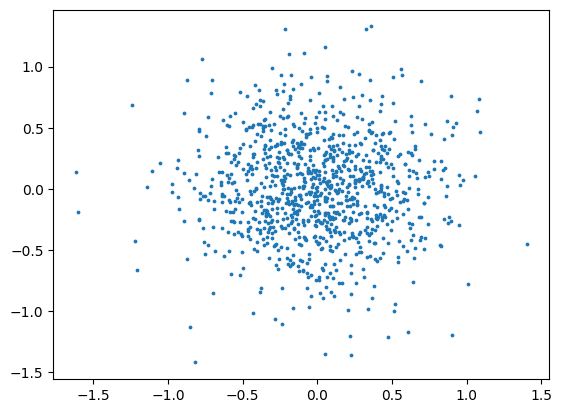

In [19]:
prior = Prior(2, device=device, scale = noise_schedule.h(1) ** 0.5)
x1_samples = prior.sample(1000).detach()
plt.scatter(x1_samples[:, 0].cpu(), x1_samples[:, 1].cpu(), s=3)

In [20]:
from src.models.components.prioritised_replay_buffer import SimpleBuffer
buffer = SimpleBuffer(
    2,
    10000,
    1000,
    initial_sampler=None,
    device=device,
    fill_buffer_during_init=False,
    sample_with_replacement=True,
    prioritize=False,
)

Buffer not initialised, expected that checkpoint will be loaded.


In [21]:
clipper = Clipper(
    should_clip_scores=True, should_clip_log_rewards=False, max_score_norm=20
)

In [22]:
t_switch_estimators = 0.7
outer_epochs= 100
inner_epochs = 100

batch_size = 512

x1_samples_energy = target(x1_samples.detach())
buffer.add(x1_samples, x1_samples_energy)

train_dataset = TensorDataset(x1_samples.detach(), x1_samples_energy.clone())
trainloader = DataLoader(train_dataset, batch_size = batch_size, shuffle=True) 

num_mc_samples = 200

In [29]:
score_net = MyMLP().to(device)
model = EnergyNet(score_net, prior).to(device)
optimizer = Adam(model.parameters(), lr=1e-3)
weighted = False

  0%|          | 0/100 [00:00<?, ?it/s]

Epoch 0 | Loss 82.720589


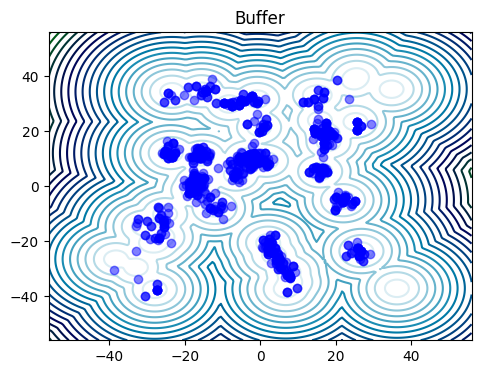

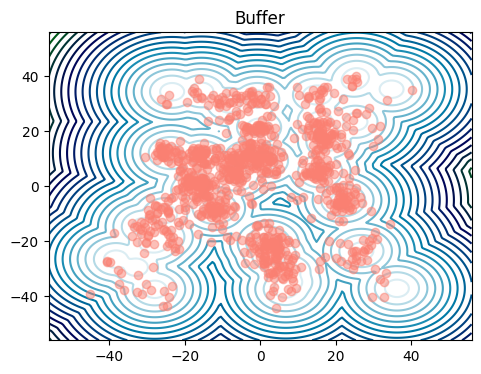

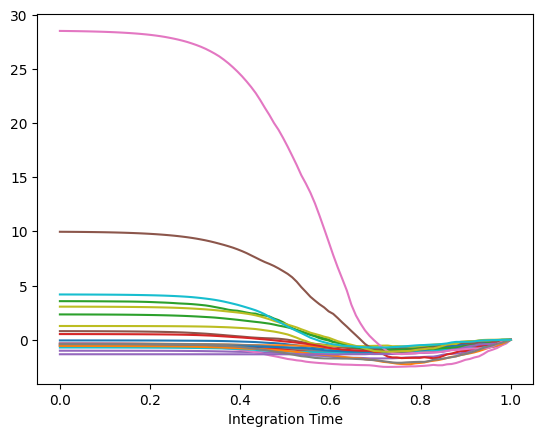

Epoch 49 | Loss 90.622513


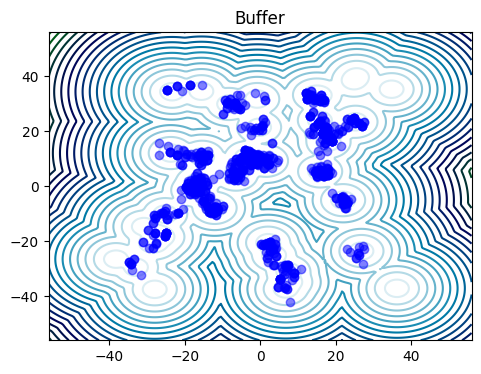

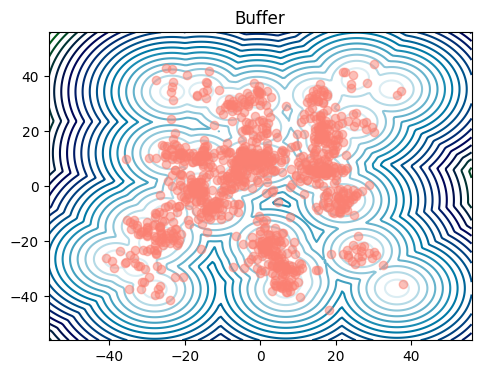

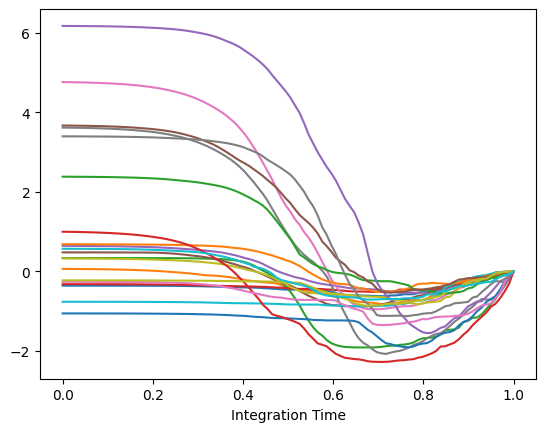

Epoch 98 | Loss 79.238625


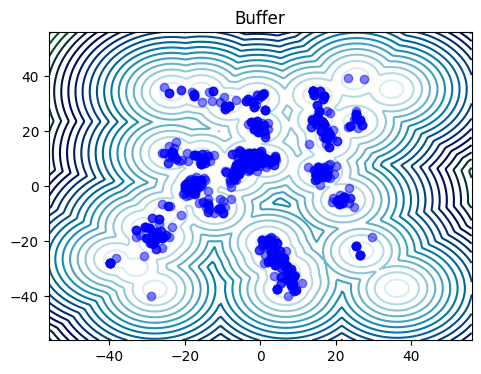

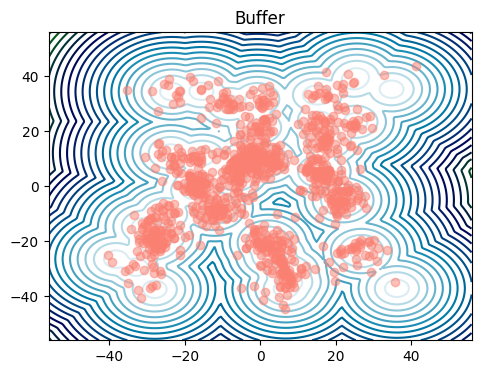

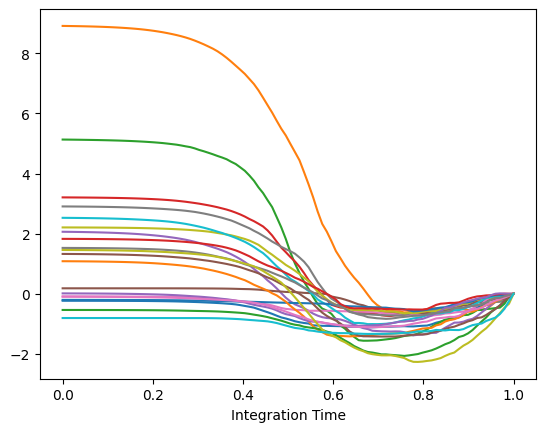

  1%|          | 1/100 [01:24<2:19:31, 84.56s/it]

Mean of Energy tensor(-407745.2500, device='cuda:0', grad_fn=<MeanBackward0>)
Epoch 0 | Loss 76.742966


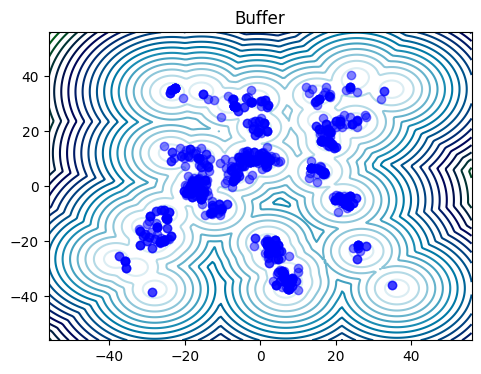

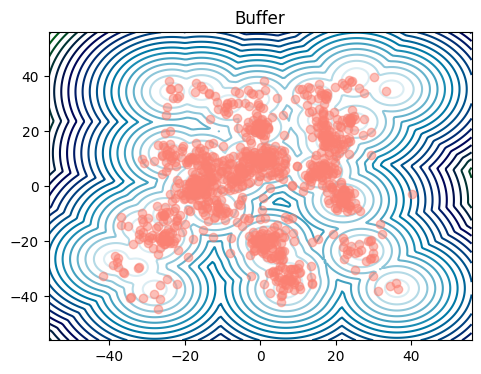

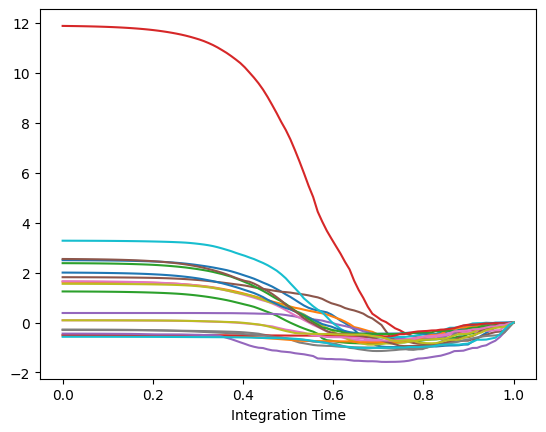

Epoch 49 | Loss 65.577423


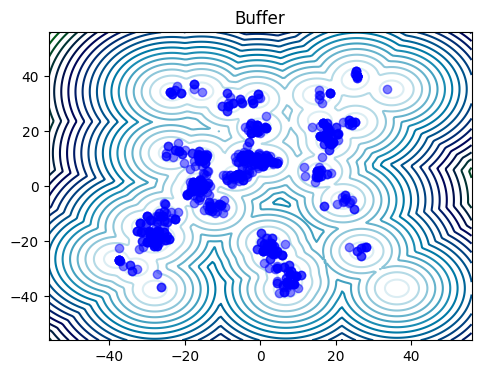

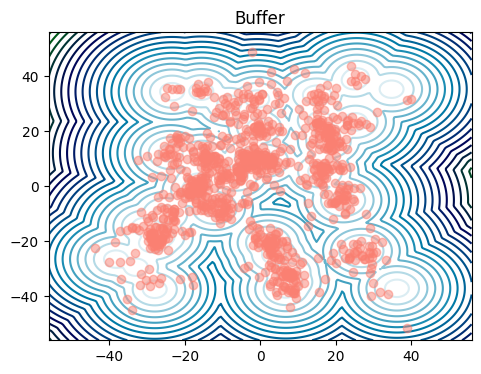

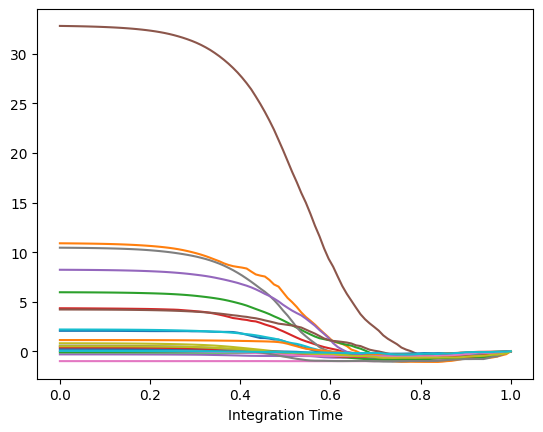

Epoch 98 | Loss 56.364685


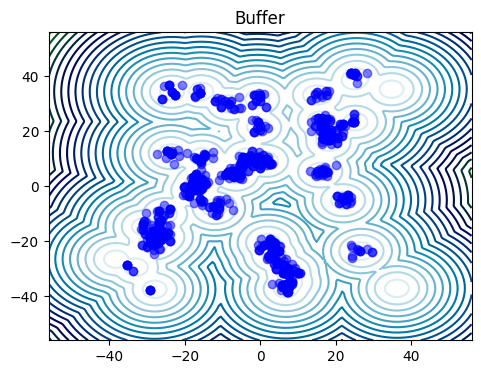

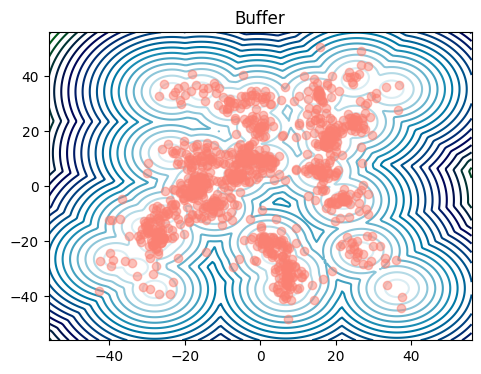

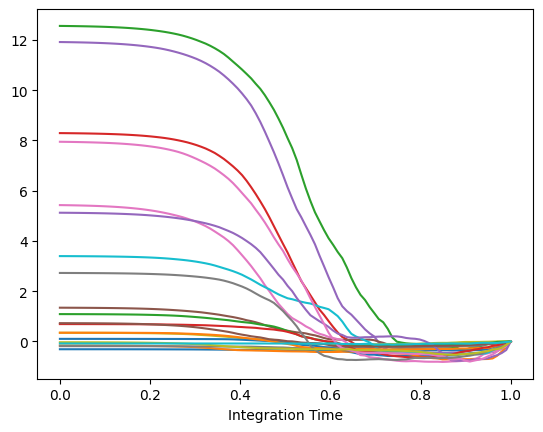

  2%|▏         | 2/100 [03:04<2:32:30, 93.37s/it]

Mean of Energy tensor(-646437., device='cuda:0', grad_fn=<MeanBackward0>)
Epoch 0 | Loss 60.861397


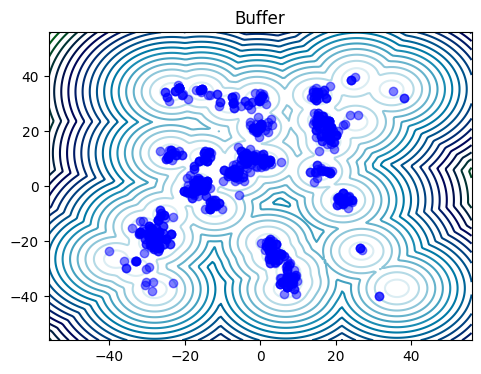

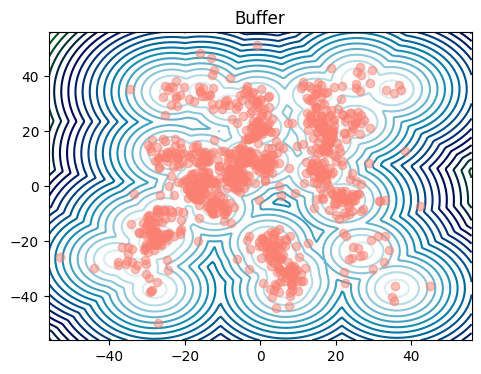

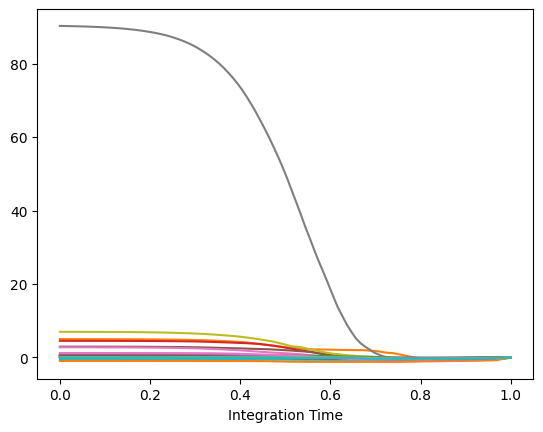

Epoch 49 | Loss 51.217892


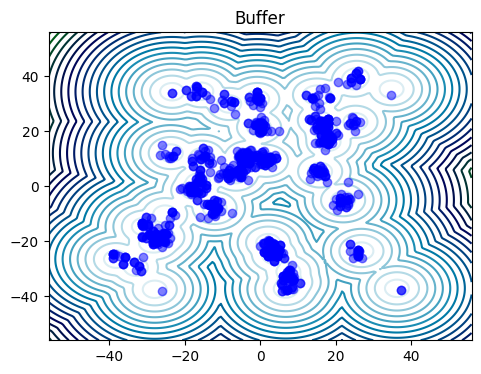

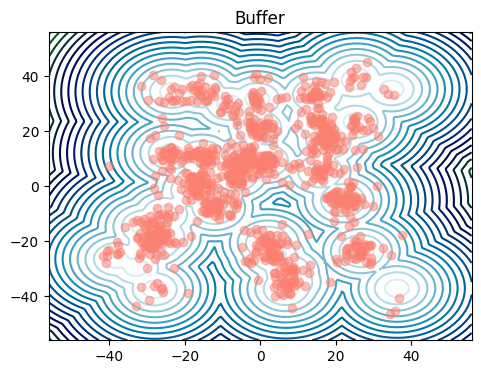

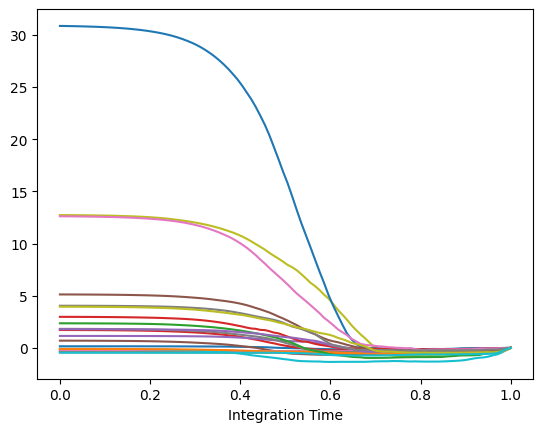

Epoch 98 | Loss 48.758202


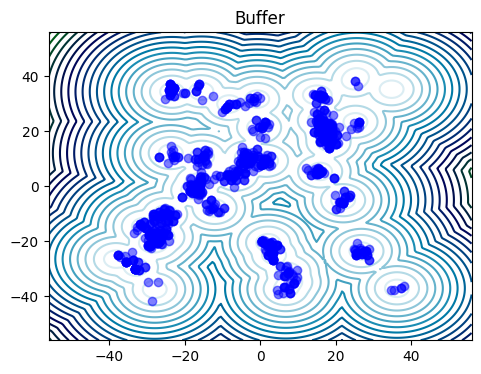

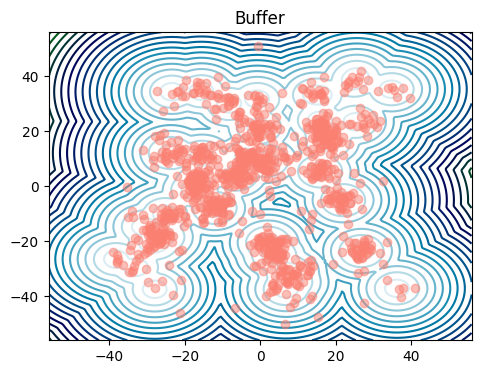

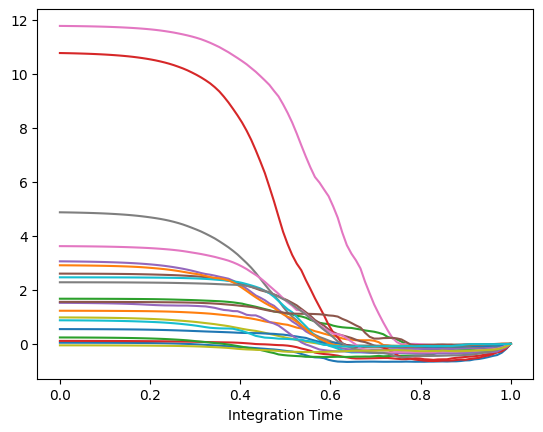

  3%|▎         | 3/100 [04:43<2:35:18, 96.07s/it]

Mean of Energy tensor(-643710.7500, device='cuda:0', grad_fn=<MeanBackward0>)
Epoch 0 | Loss 54.722248


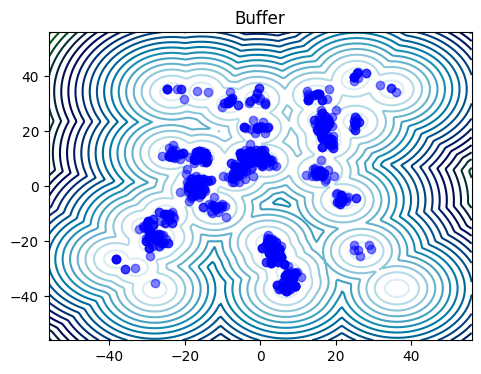

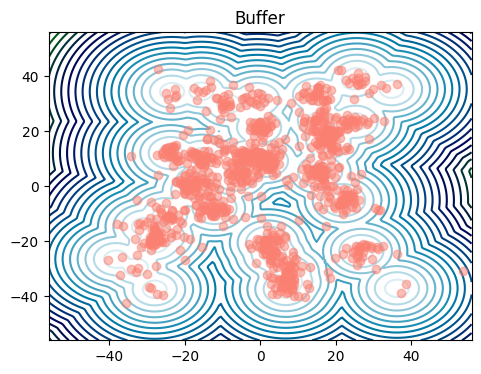

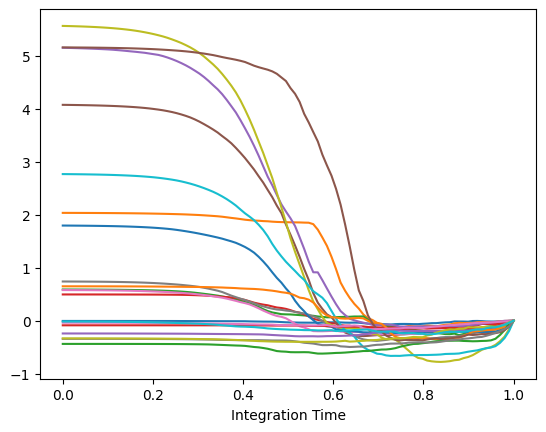

Epoch 49 | Loss 52.199886


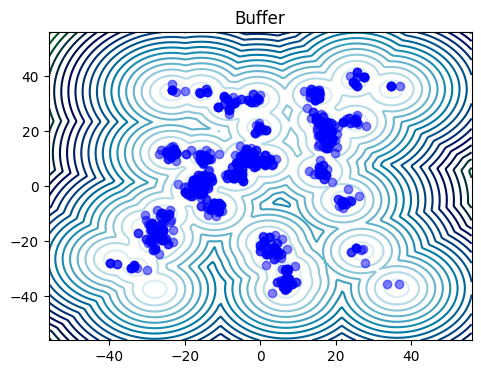

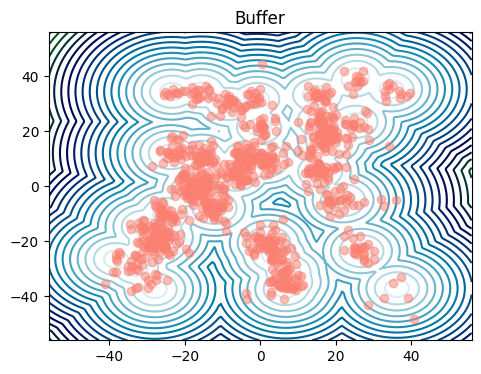

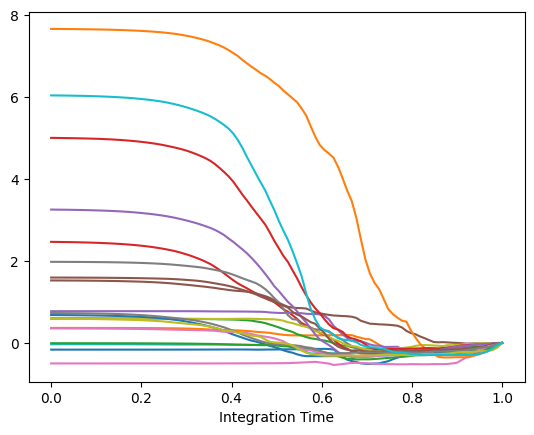

Epoch 98 | Loss 52.141712


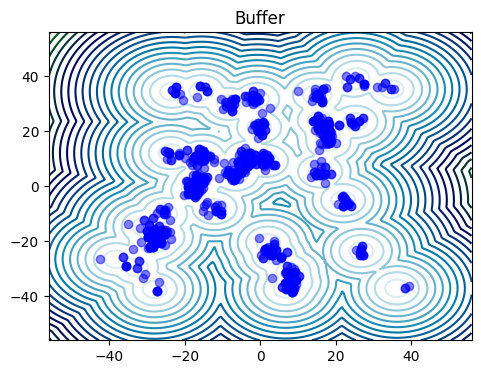

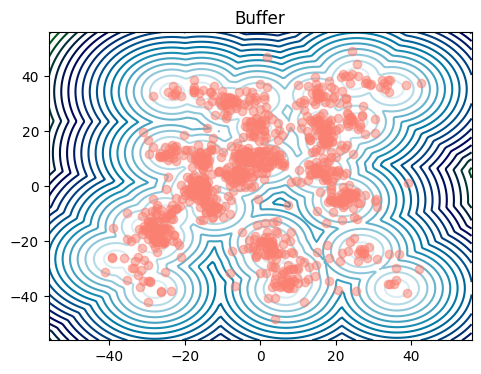

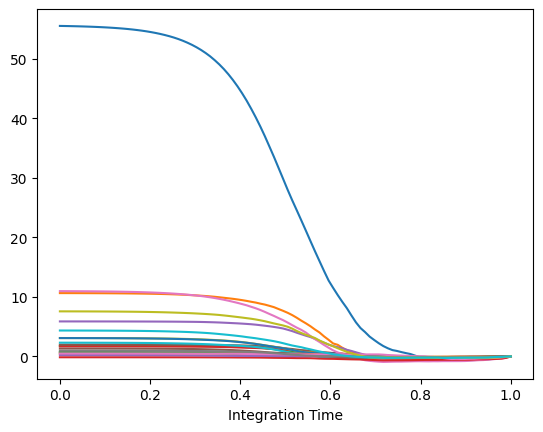

  4%|▍         | 4/100 [06:24<2:37:09, 98.22s/it]

Mean of Energy tensor(-547629.7500, device='cuda:0', grad_fn=<MeanBackward0>)
Epoch 0 | Loss 49.659851


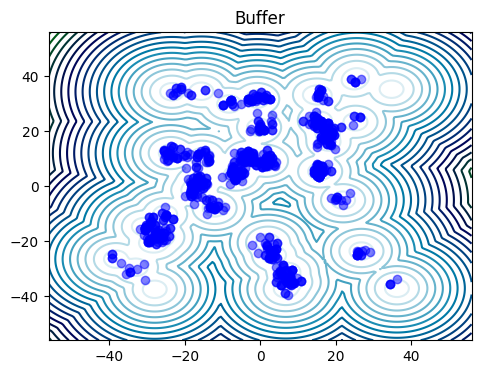

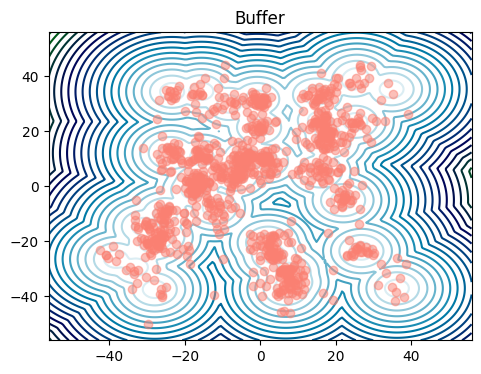

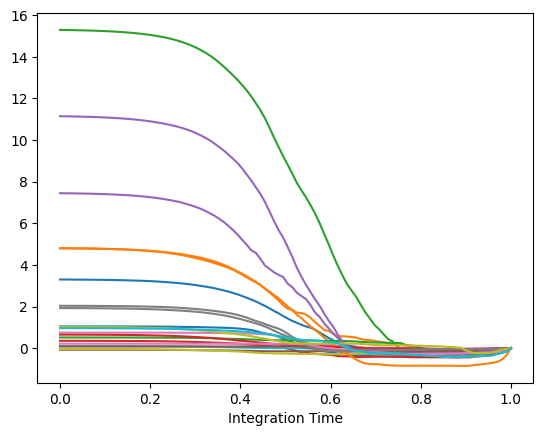

Epoch 49 | Loss 48.533985


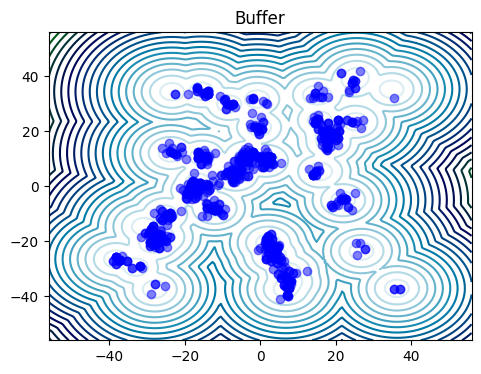

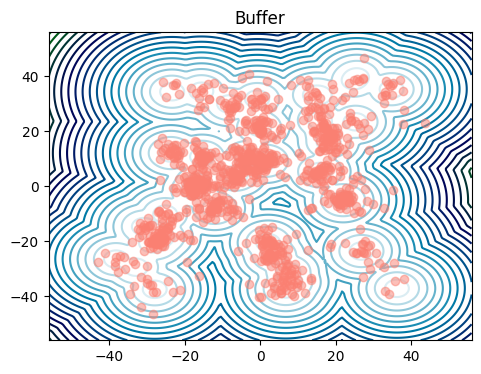

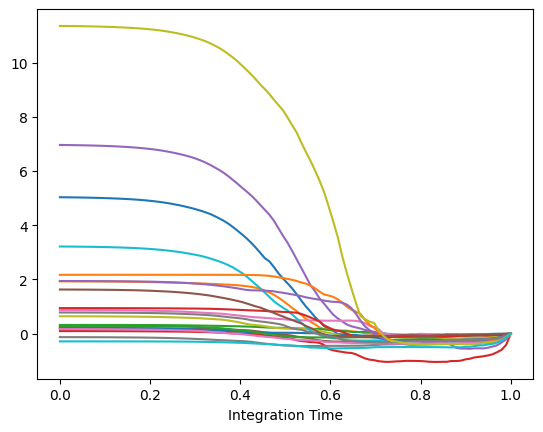

Epoch 98 | Loss 42.910400


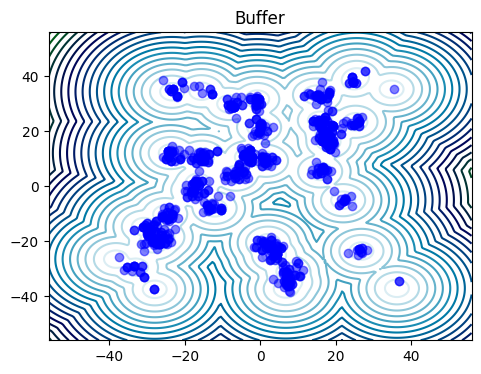

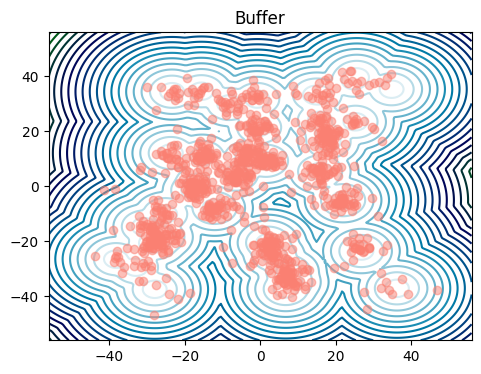

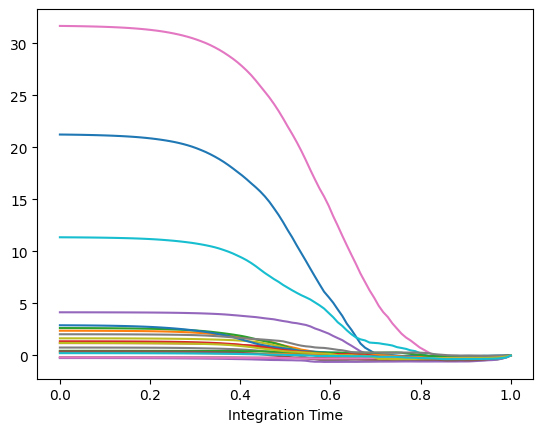

  5%|▌         | 5/100 [08:10<2:39:55, 101.01s/it]

Mean of Energy tensor(-511192.3438, device='cuda:0', grad_fn=<MeanBackward0>)
Epoch 0 | Loss 41.831261


  5%|▌         | 5/100 [08:19<2:38:19, 99.99s/it] 


KeyboardInterrupt: 

In [31]:
for epoch in tqdm(range(outer_epochs)):
    for epoch in range(inner_epochs):
        total_loss = 0.
        for samples,_ in trainloader:
            samples = samples.to(device)


            samples_high_t = samples[:batch_size//2]
            samples_low_t = samples[batch_size//2:]
            
            optimizer.zero_grad()

            t = torch.rand(len(samples)).to(device)
            t_high = t[:batch_size//2] * (1-t_switch_estimators) + t_switch_estimators
            t_low = t[batch_size//2:] * t_switch_estimators

            rm_loss_high_t = reward_matching_loss(estimate_grad_Rt,
                                                  model, 
                                                  target,
                                                  samples_high_t,
                                                  t_high, 
                                                  samples,
                                                  noise_schedule, 
                                                  num_mc_samples=num_mc_samples,
                                                  ) 
            
            rm_loss_low_t = reward_matching_loss(estimate_grad_Rt,
                                                  model, 
                                                  target,
                                                  samples_low_t,
                                                  t_low, 
                                                  samples,
                                                  noise_schedule, 
                                                  num_mc_samples=num_mc_samples,
                                                  )

            
            loss = rm_loss_high_t.mean() + rm_loss_low_t.mean()
            total_loss += loss.item()
            loss.backward()
            optimizer.step()
            
        if epoch % 49 == 0:
            print("Epoch %d | Loss %f" % (epoch, loss.item()))
            ve_reverse_sde = VEReverse_coupled(model, noise_schedule)
            prior_samples = prior.sample(1000)
            samples_weighted, _ = generate_samples_weighted(ve_reverse_sde, t_span=(0, 1), samples=prior_samples,
                                                                      num_integration_steps=100, resampling_interval=99)
            target.get_dataset_fig(target.unnormalize(samples_weighted))
            plt.show()

            ve_reverse_sde = VEReverse_coupled(model, noise_schedule)
            samples, log_weights = generate_samples_weighted(ve_reverse_sde, t_span=(0, 1), samples=prior_samples,
                                                   num_integration_steps=100, resampling_interval=100)
            target.get_dataset_fig(target.unnormalize(samples), color="salmon")
            plt.show()
            plt.plot(torch.linspace(1, 0, 100), log_weights.cpu().detach().numpy()[:, :20])
            plt.xlabel("Integration Time")
            plt.show()


    # Generate samples using the network
    ve_reverse_sde = VEReverse_coupled(model, noise_schedule)
    samples, _ = generate_samples_weighted(ve_reverse_sde, 1000, t_span=(0, 1), resampling_interval=1)
    samples_energy = target(target.unnormalize(samples))

    # Update Buffer 
    buffer.add(samples, samples_energy)

    print("Mean of Energy", samples_energy.mean())
    
    # target.get_dataset_fig(samples)
    # plt.show()

    # Resample data from the buffer
    samples, samples_energy, _ = buffer.sample(512 * 10)
    train_dataset = TensorDataset(samples, samples_energy)
    trainloader = DataLoader(train_dataset, batch_size = 512, shuffle=True)